In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import savgol_filter
import umap
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torch.optim as optim

from torchvision.utils import make_grid

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
import os
os.chdir('../IConNet/')
os.getcwd()

'/home/linh/projects/IConNet'

In [5]:
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:512"
import gc
import sys
import numpy as np
from tqdm import tqdm

In [6]:
from IConNet.acov.audio_vqvae import VqVaeClsLoss
from IConNet.trainer.train_torch import get_dataloader
from IConNet.trainer.train_torch import Trainer_SCB10 as Trainer
from IConNet.acov.model import SCB7 as SCB
from omegaconf import OmegaConf as ocf

In [7]:
dataset_name = 'crema_d'
experiment_prefix = "scb7"
log_dir = f'../{experiment_prefix}_models/{dataset_name}/'
data_dir = "../data/data_preprocessed/"
dataset_config_path = f'config/dataset/{dataset_name}.yaml'
dataset_config = ocf.load(dataset_config_path)
print(dataset_config)
batch_size = 4

{'name': 'crema_d', 'dataset_class': 'WaveformDataset', 'root': 'crema_d/', 'audio_dir': 'full_release/', 'feature_dir': 'preprocessing/', 'label_name': 'label6', 'feature_name': 'audio16k', 'num_classes': 6, 'label_values': ['neu', 'hap', 'sad', 'ang', 'fea', 'dis'], 'classnames': ['neu', 'hap', 'sad', 'ang', 'fea', 'dis'], 'target_labels': ['ang', 'neu', 'sad', 'hap']}


In [13]:
# codebook_pretrained_path_np = f'../scb7_models/ravdess/scb7.codebook.ravdess.step10000.npy'
# codebook_pretrained_path = f'../scb7_models/ravdess/codebook.step=10000.pt'
# codebook = np.load(codebook_pretrained_path_np, allow_pickle=True)
# codebook_tensor = torch.from_numpy(codebook).type(torch.float)
# torch.save(codebook_tensor, codebook_pretrained_path)

In [8]:
train_loader, test_loader, batch_size = get_dataloader(
    dataset_config, data_dir, batch_size=batch_size)

In [9]:
loss_ratio=VqVaeClsLoss(perplexity=0, loss_vq=1, loss_recon=1, loss_cls=0.15)
trainer = Trainer(batch_size=batch_size, log_dir=log_dir, 
                  experiment_prefix=experiment_prefix, device=device,
                 accumulate_grad_batches=4)
trainer.prepare(train_loader=train_loader, 
                test_loader=test_loader, 
                batch_size=batch_size,
               loss_ratio=loss_ratio)

In [10]:
in_channels = 1
out_channels = 8
embedding_dim = 1023
num_embeddings = 384
commitment_cost = 0.25
learning_rate = 1e-4
num_tokens = 256
num_classes = 4

In [11]:
codebook_pretrained_path = f'../scb7_models/ravdess/codebook.step=10000.pt'
model = SCB(
    in_channels=in_channels,
    out_channels=out_channels,
    num_embeddings=num_embeddings, 
    embedding_dim=embedding_dim, 
    num_tokens=num_tokens,
    num_classes=num_classes, 
    cls_dim=embedding_dim,
    sample_rate=16000,
    commitment_cost=commitment_cost,
    distance_type='euclidean',
    codebook_pretrained_path=codebook_pretrained_path,
    freeze_codebook=False,
    loss_type='signal_loss',
)

In [12]:
trainer.setup(model=model, lr=learning_rate)

In [13]:
trainer.fit(
    n_epoch=100, lr=learning_rate, self_supervised=False, 
    train_task='embedding', test_n_epoch=10)

  0%|▍                                                                               | 0.4771622934888197/100 [02:56<142:07:18, 5140.92s/it]

Epoch: 1	Loss: 73.076 [perplexity=16.613, loss_vq=72.725, loss_recon=0.152, loss_cls=1.325]	Val_acc: 114/196 (58.16%)

Saved new best val model: ../scb7_models/crema_d/model.epoch=1.step=368.loss=73.076.val_acc=0.582.pt


  1%|█▏                                                                                  | 1.428571428571455/100 [07:40<7:20:15, 267.98s/it]

Correct: 501/980 (0.5112)
Saved new best test model: ../scb7_models/crema_d/model.epoch=1.step=735.test_acc=0.5112.pt
{'acc_unweighted': tensor(0.5063, device='cuda:0'),
 'acc_weighted': tensor(0.5112, device='cuda:0'),
 'f1s_unweighted': tensor(0.4924, device='cuda:0'),
 'f1s_weighted': tensor(0.4976, device='cuda:0'),
 'rocauc': tensor(0.7862, device='cuda:0'),
 'uar': tensor(0.5063, device='cuda:0'),
 'wap': tensor(0.5226, device='cuda:0')}
{'acc_detail': tensor([0.5433, 0.3716, 0.8425, 0.2677], device='cuda:0'),
 'f1s_detail': tensor([0.6287, 0.3506, 0.6544, 0.3358], device='cuda:0'),
 'precision_detail': tensor([0.7459, 0.3320, 0.5350, 0.4503], device='cuda:0'),
 'recall_detail': tensor([0.5433, 0.3716, 0.8425, 0.2677], device='cuda:0'),
 'rocauc_detail': tensor([0.8879, 0.6902, 0.8871, 0.6797], device='cuda:0')}
tensor([[138,  40,  10,  66],
        [  1,  81, 124,  12],
        [  0,  35, 214,   5],
        [ 46,  88,  52,  68]], device='cuda:0')


  2%|█▌                                                                              | 1.9057337220602952/100 [10:42<137:58:17, 5063.47s/it]

Epoch: 2	Loss: 112.384 [perplexity=21.544, loss_vq=112.073, loss_recon=0.175, loss_cls=0.904]	Val_acc: 112/196 (57.14%)



  3%|██▎                                                                             | 2.8581146744412798/100 [16:29<136:15:51, 5049.85s/it]

Epoch: 3	Loss: 41.618 [perplexity=21.852, loss_vq=41.032, loss_recon=0.195, loss_cls=2.609]	Val_acc: 110/196 (56.12%)



  4%|███                                                                             | 3.8104956268222643/100 [22:17<137:54:49, 5161.58s/it]

Epoch: 4	Loss: 34.250 [perplexity=15.818, loss_vq=33.896, loss_recon=0.214, loss_cls=0.933]	Val_acc: 119/196 (60.71%)

Saved new best val model: ../scb7_models/crema_d/model.epoch=4.step=2573.loss=34.250.val_acc=0.607.pt


  5%|███▊                                                                             | 4.762876579203248/100 [28:03<138:32:55, 5237.19s/it]

Epoch: 5	Loss: 51.848 [perplexity=18.375, loss_vq=51.396, loss_recon=0.190, loss_cls=1.750]	Val_acc: 110/196 (56.12%)



  6%|████▋                                                                            | 5.715257531584233/100 [33:43<133:09:32, 5084.31s/it]

Epoch: 6	Loss: 21.757 [perplexity=15.740, loss_vq=21.484, loss_recon=0.183, loss_cls=0.600]	Val_acc: 128/196 (65.31%)

Saved new best val model: ../scb7_models/crema_d/model.epoch=6.step=4043.loss=21.757.val_acc=0.653.pt


  7%|█████▍                                                                           | 6.667638483965217/100 [39:23<132:40:19, 5117.40s/it]

Epoch: 7	Loss: 43.864 [perplexity=20.413, loss_vq=43.582, loss_recon=0.172, loss_cls=0.731]	Val_acc: 117/196 (59.69%)



  8%|██████▏                                                                          | 7.620019436346202/100 [45:03<130:16:02, 5076.45s/it]

Epoch: 8	Loss: 41.107 [perplexity=21.852, loss_vq=40.691, loss_recon=0.202, loss_cls=1.419]	Val_acc: 127/196 (64.80%)



  9%|██████▉                                                                          | 8.572400388727186/100 [50:43<131:49:12, 5190.47s/it]

Epoch: 9	Loss: 55.186 [perplexity=18.918, loss_vq=54.911, loss_recon=0.188, loss_cls=0.576]	Val_acc: 115/196 (58.67%)



 10%|███████▊                                                                          | 9.52478134110817/100 [56:24<132:18:08, 5264.30s/it]

Epoch: 10	Loss: 60.094 [perplexity=25.768, loss_vq=59.773, loss_recon=0.162, loss_cls=1.059]	Val_acc: 125/196 (63.78%)



 10%|████████▏                                                                     | 10.477162293489155/100 [1:02:05<126:55:22, 5103.97s/it]

Epoch: 11	Loss: 25.582 [perplexity=19.171, loss_vq=25.286, loss_recon=0.198, loss_cls=0.651]	Val_acc: 116/196 (59.18%)



 11%|█████████▎                                                                       | 11.428571428571791/100 [1:06:54<6:38:36, 270.02s/it]

Correct: 609/980 (0.6214)
Saved new best test model: ../scb7_models/crema_d/model.epoch=11.step=8085.test_acc=0.6214.pt
{'acc_unweighted': tensor(0.6166, device='cuda:0'),
 'acc_weighted': tensor(0.6214, device='cuda:0'),
 'f1s_unweighted': tensor(0.5980, device='cuda:0'),
 'f1s_weighted': tensor(0.6010, device='cuda:0'),
 'rocauc': tensor(0.8556, device='cuda:0'),
 'uar': tensor(0.6166, device='cuda:0'),
 'wap': tensor(0.6214, device='cuda:0')}
{'acc_detail': tensor([0.8346, 0.4862, 0.8150, 0.3307], device='cuda:0'),
 'f1s_detail': tensor([0.7310, 0.5183, 0.7041, 0.4386], device='cuda:0'),
 'precision_detail': tensor([0.6503, 0.5550, 0.6198, 0.6512], device='cuda:0'),
 'recall_detail': tensor([0.8346, 0.4862, 0.8150, 0.3307], device='cuda:0'),
 'rocauc_detail': tensor([0.9092, 0.8405, 0.9063, 0.7664], device='cuda:0')}
tensor([[212,  11,   9,  22],
        [ 13, 106,  83,  16],
        [  4,  36, 207,   7],
        [ 97,  38,  35,  84]], device='cuda:0')


 12%|█████████▎                                                                    | 11.905733722060631/100 [1:09:55<127:52:39, 5225.76s/it]

Epoch: 12	Loss: 30.568 [perplexity=28.100, loss_vq=30.223, loss_recon=0.212, loss_cls=0.888]	Val_acc: 111/196 (56.63%)



 13%|██████████                                                                    | 12.858114674441616/100 [1:15:38<127:22:02, 5261.79s/it]

Epoch: 13	Loss: 37.004 [perplexity=13.085, loss_vq=36.732, loss_recon=0.178, loss_cls=0.632]	Val_acc: 126/196 (64.29%)



 14%|███████████                                                                     | 13.8104956268226/100 [1:21:22<124:05:07, 5182.86s/it]

Epoch: 14	Loss: 25.670 [perplexity=20.971, loss_vq=25.345, loss_recon=0.223, loss_cls=0.682]	Val_acc: 125/196 (63.78%)



 15%|███████████▌                                                                  | 14.762876579203585/100 [1:27:03<123:59:38, 5236.90s/it]

Epoch: 15	Loss: 27.910 [perplexity=22.819, loss_vq=27.629, loss_recon=0.171, loss_cls=0.731]	Val_acc: 118/196 (60.20%)



 16%|████████████▍                                                                  | 15.71525753158457/100 [1:32:43<121:22:56, 5184.52s/it]

Epoch: 16	Loss: 40.208 [perplexity=20.082, loss_vq=39.824, loss_recon=0.176, loss_cls=1.384]	Val_acc: 121/196 (61.73%)



 17%|█████████████                                                                 | 16.667638483964332/100 [1:38:23<120:23:10, 5200.75s/it]

Epoch: 17	Loss: 39.552 [perplexity=19.756, loss_vq=39.303, loss_recon=0.206, loss_cls=0.286]	Val_acc: 129/196 (65.82%)

Saved new best val model: ../scb7_models/crema_d/model.epoch=17.step=12128.loss=39.552.val_acc=0.658.pt


 18%|█████████████▋                                                                | 17.620019436343576/100 [1:44:06<118:52:16, 5194.67s/it]

Epoch: 18	Loss: 19.486 [perplexity=23.830, loss_vq=19.243, loss_recon=0.182, loss_cls=0.409]	Val_acc: 120/196 (61.22%)



 19%|██████████████▋                                                                | 18.57240038872282/100 [1:49:48<118:12:54, 5226.41s/it]

Epoch: 19	Loss: 33.654 [perplexity=12.891, loss_vq=33.295, loss_recon=0.157, loss_cls=1.349]	Val_acc: 123/196 (62.76%)



 20%|███████████████▏                                                              | 19.524781341102063/100 [1:55:30<116:02:08, 5190.77s/it]

Epoch: 20	Loss: 15.084 [perplexity=14.034, loss_vq=14.650, loss_recon=0.186, loss_cls=1.657]	Val_acc: 115/196 (58.67%)



 20%|███████████████▉                                                              | 20.477162293481307/100 [2:01:13<115:05:42, 5210.35s/it]

Epoch: 21	Loss: 18.529 [perplexity=11.609, loss_vq=18.272, loss_recon=0.207, loss_cls=0.331]	Val_acc: 119/196 (60.71%)



 21%|█████████████████▎                                                               | 21.428571428562204/100 [2:06:07<6:02:42, 276.98s/it]

Correct: 603/980 (0.6153)
{'acc_unweighted': tensor(0.6055, device='cuda:0'),
 'acc_weighted': tensor(0.6153, device='cuda:0'),
 'f1s_unweighted': tensor(0.6006, device='cuda:0'),
 'f1s_weighted': tensor(0.6066, device='cuda:0'),
 'rocauc': tensor(0.8636, device='cuda:0'),
 'uar': tensor(0.6055, device='cuda:0'),
 'wap': tensor(0.6263, device='cuda:0')}
{'acc_detail': tensor([0.6299, 0.3394, 0.8031, 0.6496], device='cuda:0'),
 'f1s_detail': tensor([0.6751, 0.4379, 0.7273, 0.5622], device='cuda:0'),
 'precision_detail': tensor([0.7273, 0.6167, 0.6645, 0.4955], device='cuda:0'),
 'recall_detail': tensor([0.6299, 0.3394, 0.8031, 0.6496], device='cuda:0'),
 'rocauc_detail': tensor([0.9086, 0.8410, 0.9124, 0.7923], device='cuda:0')}
tensor([[160,   4,   6,  84],
        [  8,  74,  77,  59],
        [  1,  24, 204,  25],
        [ 51,  18,  20, 165]], device='cuda:0')


 22%|█████████████████                                                             | 21.905733722050172/100 [2:09:07<112:18:49, 5177.45s/it]

Epoch: 22	Loss: 72.004 [perplexity=26.909, loss_vq=71.754, loss_recon=0.175, loss_cls=0.501]	Val_acc: 122/196 (62.24%)



 23%|█████████████████▊                                                            | 22.858114674429416/100 [2:14:50<112:54:53, 5269.42s/it]

Epoch: 23	Loss: 29.884 [perplexity=22.819, loss_vq=29.636, loss_recon=0.162, loss_cls=0.574]	Val_acc: 128/196 (65.31%)



 24%|██████████████████▊                                                            | 23.81049562680866/100 [2:20:32<109:48:03, 5188.16s/it]

Epoch: 24	Loss: 22.585 [perplexity=22.819, loss_vq=22.313, loss_recon=0.217, loss_cls=0.367]	Val_acc: 127/196 (64.80%)



 25%|███████████████████▎                                                          | 24.762876579187903/100 [2:26:15<108:55:24, 5211.84s/it]

Epoch: 25	Loss: 35.794 [perplexity=27.644, loss_vq=35.499, loss_recon=0.177, loss_cls=0.783]	Val_acc: 121/196 (61.73%)



 26%|████████████████████                                                          | 25.715257531567147/100 [2:31:59<107:46:02, 5222.64s/it]

Epoch: 26	Loss: 20.663 [perplexity=18.359, loss_vq=20.448, loss_recon=0.171, loss_cls=0.294]	Val_acc: 116/196 (59.18%)



 27%|█████████████████████                                                          | 26.66763848394639/100 [2:37:45<106:25:26, 5224.52s/it]

Epoch: 27	Loss: 40.153 [perplexity=22.819, loss_vq=39.834, loss_recon=0.193, loss_cls=0.837]	Val_acc: 125/196 (63.78%)



 28%|█████████████████████▌                                                        | 27.620019436325634/100 [2:43:30<106:42:21, 5307.29s/it]

Epoch: 28	Loss: 19.033 [perplexity=14.058, loss_vq=18.810, loss_recon=0.166, loss_cls=0.380]	Val_acc: 122/196 (62.24%)



 29%|██████████████████████▎                                                       | 28.572400388704878/100 [2:49:16<105:27:24, 5315.10s/it]

Epoch: 29	Loss: 27.215 [perplexity=21.899, loss_vq=26.866, loss_recon=0.181, loss_cls=1.118]	Val_acc: 119/196 (60.71%)



 30%|███████████████████████                                                       | 29.524781341084122/100 [2:55:02<103:20:28, 5278.86s/it]

Epoch: 30	Loss: 24.182 [perplexity=19.027, loss_vq=23.898, loss_recon=0.167, loss_cls=0.779]	Val_acc: 118/196 (60.20%)



 30%|███████████████████████▊                                                      | 30.477162293463365/100 [3:00:48<102:32:19, 5309.61s/it]

Epoch: 31	Loss: 62.608 [perplexity=23.830, loss_vq=62.395, loss_recon=0.176, loss_cls=0.247]	Val_acc: 111/196 (56.63%)



 31%|█████████████████████████▍                                                       | 31.428571428544263/100 [3:05:44<5:14:58, 275.60s/it]

Correct: 561/980 (0.5724)
{'acc_unweighted': tensor(0.5580, device='cuda:0'),
 'acc_weighted': tensor(0.5724, device='cuda:0'),
 'f1s_unweighted': tensor(0.5316, device='cuda:0'),
 'f1s_weighted': tensor(0.5417, device='cuda:0'),
 'rocauc': tensor(0.8372, device='cuda:0'),
 'uar': tensor(0.5580, device='cuda:0'),
 'wap': tensor(0.5738, device='cuda:0')}
{'acc_detail': tensor([0.6929, 0.1651, 0.8425, 0.5315], device='cuda:0'),
 'f1s_detail': tensor([0.6822, 0.2562, 0.6926, 0.4954], device='cuda:0'),
 'precision_detail': tensor([0.6718, 0.5714, 0.5879, 0.4639], device='cuda:0'),
 'recall_detail': tensor([0.6929, 0.1651, 0.8425, 0.5315], device='cuda:0'),
 'rocauc_detail': tensor([0.8872, 0.8146, 0.9008, 0.7463], device='cuda:0')}
tensor([[176,   6,   8,  64],
        [ 10,  36, 106,  66],
        [  4,  10, 214,  26],
        [ 72,  11,  36, 135]], device='cuda:0')


 32%|█████████████████████████▏                                                     | 31.90573372203223/100 [3:08:47<100:03:23, 5289.78s/it]

Epoch: 32	Loss: 16.342 [perplexity=14.058, loss_vq=16.044, loss_recon=0.183, loss_cls=0.762]	Val_acc: 116/196 (59.18%)



 33%|██████████████████████████▎                                                     | 32.85811467441461/100 [3:14:35<97:55:15, 5250.31s/it]

Epoch: 33	Loss: 22.277 [perplexity=22.869, loss_vq=22.025, loss_recon=0.202, loss_cls=0.329]	Val_acc: 109/196 (55.61%)



 34%|██████████████████████████▋                                                    | 33.810495626797334/100 [3:20:24<96:48:57, 5265.75s/it]

Epoch: 34	Loss: 22.525 [perplexity=17.448, loss_vq=22.263, loss_recon=0.182, loss_cls=0.537]	Val_acc: 126/196 (64.29%)



 35%|███████████████████████████▊                                                    | 34.76287657918006/100 [3:26:13<97:23:39, 5374.54s/it]

Epoch: 35	Loss: 55.715 [perplexity=29.344, loss_vq=55.529, loss_recon=0.177, loss_cls=0.058]	Val_acc: 121/196 (61.73%)



 36%|████████████████████████████▏                                                  | 35.715257531562784/100 [3:32:03<95:27:19, 5345.58s/it]

Epoch: 36	Loss: 73.297 [perplexity=26.909, loss_vq=73.093, loss_recon=0.186, loss_cls=0.126]	Val_acc: 115/196 (58.67%)



 37%|█████████████████████████████▎                                                  | 36.66763848394551/100 [3:37:55<96:25:10, 5480.77s/it]

Epoch: 37	Loss: 22.115 [perplexity=24.885, loss_vq=21.517, loss_recon=0.208, loss_cls=2.603]	Val_acc: 124/196 (63.27%)



 38%|█████████████████████████████▋                                                 | 37.620019436328235/100 [3:43:50<92:23:44, 5332.23s/it]

Epoch: 38	Loss: 30.194 [perplexity=22.819, loss_vq=30.015, loss_recon=0.168, loss_cls=0.074]	Val_acc: 110/196 (56.12%)



 39%|██████████████████████████████▊                                                 | 38.57240038871096/100 [3:49:42<89:21:54, 5237.29s/it]

Epoch: 39	Loss: 39.934 [perplexity=20.971, loss_vq=39.700, loss_recon=0.155, loss_cls=0.532]	Val_acc: 119/196 (60.71%)



 40%|███████████████████████████████▏                                               | 39.524781341093686/100 [3:55:34<89:10:08, 5308.11s/it]

Epoch: 40	Loss: 21.373 [perplexity=15.818, loss_vq=21.175, loss_recon=0.110, loss_cls=0.582]	Val_acc: 116/196 (59.18%)



 40%|████████████████████████████████▍                                               | 40.47716229347641/100 [4:01:23<87:10:50, 5272.77s/it]

Epoch: 41	Loss: 35.239 [perplexity=20.907, loss_vq=34.906, loss_recon=0.216, loss_cls=0.779]	Val_acc: 121/196 (61.73%)



 41%|█████████████████████████████████▉                                                | 41.42857142856079/100 [4:06:21<4:29:28, 276.05s/it]

Correct: 568/980 (0.5796)
{'acc_unweighted': tensor(0.5794, device='cuda:0'),
 'acc_weighted': tensor(0.5796, device='cuda:0'),
 'f1s_unweighted': tensor(0.5772, device='cuda:0'),
 'f1s_weighted': tensor(0.5791, device='cuda:0'),
 'rocauc': tensor(0.8262, device='cuda:0'),
 'uar': tensor(0.5794, device='cuda:0'),
 'wap': tensor(0.5842, device='cuda:0')}
{'acc_detail': tensor([0.7047, 0.5734, 0.5748, 0.4646], device='cuda:0'),
 'f1s_detail': tensor([0.6717, 0.5241, 0.6213, 0.4917], device='cuda:0'),
 'precision_detail': tensor([0.6416, 0.4826, 0.6759, 0.5221], device='cuda:0'),
 'recall_detail': tensor([0.7047, 0.5734, 0.5748, 0.4646], device='cuda:0'),
 'rocauc_detail': tensor([0.8827, 0.8056, 0.8791, 0.7374], device='cuda:0')}
tensor([[179,  17,   7,  51],
        [ 11, 125,  45,  37],
        [  8,  80, 146,  20],
        [ 81,  37,  18, 118]], device='cuda:0')


 41%|█████████████████████████████████▉                                                | 41.44703595722943/100 [4:06:28<5:54:40, 363.43s/it]Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x74039cc71070>>
Traceback (most recent call last):
  File "/opt/anaconda3/envs/audio/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
 41%|█████████████████████████████████▉                                                | 41.44703595722943/100 [4:06:29<5:48:13, 356.83s/it]


KeyboardInterrupt: 

In [14]:
trainer.load_best_model(val_model=True)

Loaded: ../scb7_models/crema_d/model.epoch=17.step=12128.loss=39.552.val_acc=0.658.pt


In [15]:
from pprint import pprint

In [16]:
metrics, metrics_details, confusion_matrix = trainer.test_step()

Correct: 613/980 (0.6255)
Saved new best test model: ../scb7_models/crema_d/model.epoch=42.step=30150.test_acc=0.6255.pt


In [17]:
me = metrics.cpu().compute()
med = metrics_details.cpu().compute()
cm = confusion_matrix.cpu().compute()

In [18]:
pprint(me)
pprint(med)
pprint(cm)

{'acc_unweighted': tensor(0.6259),
 'acc_weighted': tensor(0.6255),
 'f1s_unweighted': tensor(0.6204),
 'f1s_weighted': tensor(0.6217),
 'rocauc': tensor(0.8510),
 'uar': tensor(0.6259),
 'wap': tensor(0.6265)}
{'acc_detail': tensor([0.7677, 0.6376, 0.6614, 0.4370]),
 'f1s_detail': tensor([0.7117, 0.5840, 0.6957, 0.4901]),
 'precision_detail': tensor([0.6633, 0.5388, 0.7336, 0.5578]),
 'recall_detail': tensor([0.7677, 0.6376, 0.6614, 0.4370]),
 'rocauc_detail': tensor([0.8860, 0.8400, 0.9010, 0.7768])}
tensor([[195,  13,   5,  41],
        [  8, 139,  42,  29],
        [  6,  62, 168,  18],
        [ 85,  44,  14, 111]])


In [20]:
from einops import reduce

In [22]:
import pandas as pd
import IPython.display as ipd
import seaborn as sns

from IConNet.acov.visualize import (
    visualize_speech_codebook, get_embedding_color, 
    visualize_embedding_umap, visualize_training_curves,
    get_embedding_color_v2, get_zcs_color_v2
)

<Axes: xlabel='Predicted', ylabel='Actual'>

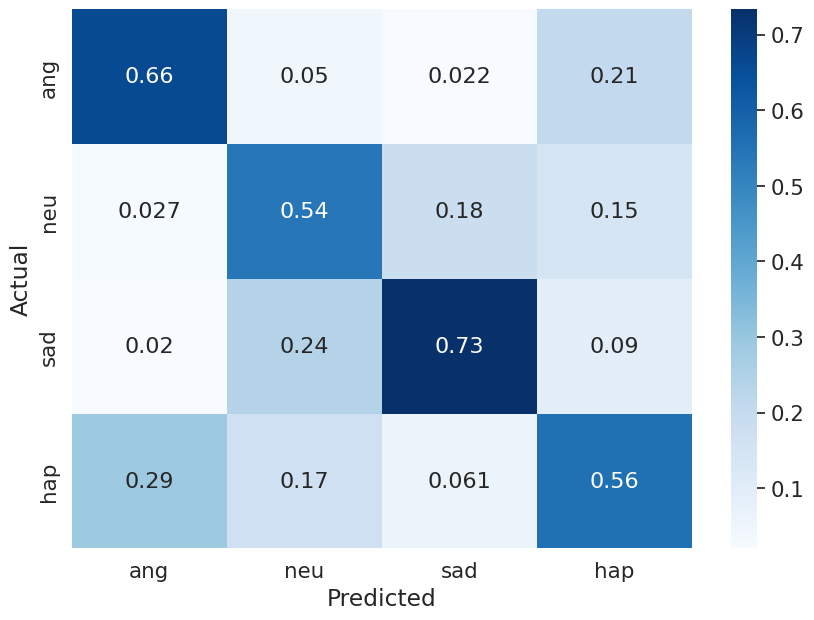

In [23]:
labels = dataset_config.target_labels
a = torch.tensor(
    [[195,  13,   5,  41],
        [  8, 139,  42,  29],
        [  6,  62, 168,  18],
        [ 85,  44,  14, 111]], dtype=torch.float)
# a /= reduce(a, 'y yh -> y 1', 'sum')
a /= reduce(a, 'y yh -> 1 yh', 'sum')
df_cm = pd.DataFrame(a, columns=labels, index = labels )
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sns.set(font_scale=1.4) #for label size
sns.heatmap(
    df_cm, cmap="Blues", 
    annot=True,
    annot_kws={"size": 16})# font size

<Axes: xlabel='Predicted', ylabel='Actual'>

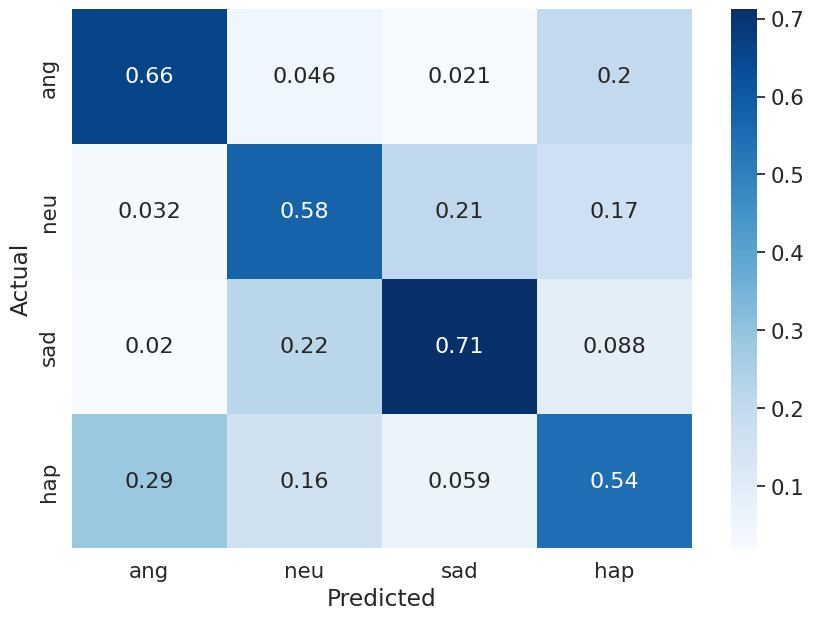

In [24]:
labels = dataset_config.target_labels
a = torch.tensor(
    [[195,  13,   5,  41],
        [  8, 139,  42,  29],
        [  6,  62, 168,  18],
        [ 85,  44,  14, 111]], dtype=torch.float)
a /= reduce(a, 'y yh -> y 1', 'sum')
a /= reduce(a, 'y yh -> 1 yh', 'sum')
df_cm = pd.DataFrame(a, columns=labels, index = labels )
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sns.set(font_scale=1.4) #for label size
sns.heatmap(
    df_cm, cmap="Blues", 
    annot=True,
    annot_kws={"size": 16})# font size

In [25]:
dt = []
for i, ld in enumerate(trainer.train_losses_detail):
    d = {'loss': trainer.train_losses[i]}
    for j, k in enumerate(ld._fields):
        d[k] = ld[j]
    dt.append(d)
loss_df2 = pd.DataFrame(dt)
loss_df2

,loss,perplexity,loss_vq,loss_recon,loss_cls
0,65.981720,15.970160,65.670670,0.115654,1.302659
1,42.845661,15.908497,42.478912,0.154453,1.415303
2,99.355263,7.708195,99.091293,0.070954,1.286760
3,63.852360,14.561363,63.486015,0.158886,1.383063
4,73.415642,10.462796,73.099937,0.115857,1.332305
...,...,...,...,...,...
30144,23.965586,18.274984,23.753593,0.177295,0.231304
30145,30.828964,19.027254,30.440693,0.176322,1.412985
30146,20.587799,8.610770,20.386166,0.154162,0.316480
30147,24.015039,28.721979,23.780632,0.184440,0.333111


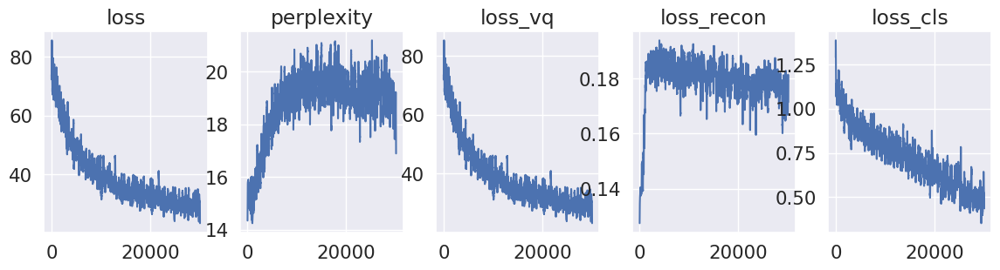

In [26]:
from scipy.signal import savgol_filter

fig, axes = plt.subplots(1, 5, figsize=(14,3))
for i, c in enumerate(loss_df2.columns):
    axes[i].plot(savgol_filter(loss_df2[c], 301, 7))
    axes[i].set_title(c)

Text(0.5, 1.0, 'Test accuracy per 10 epochs')

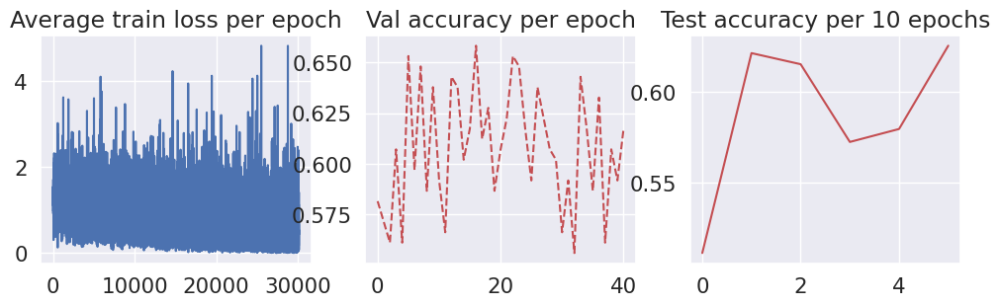

In [27]:
fig, axes = plt.subplots(1, 3, figsize=(12,3))
axes[0].plot(loss_df2['loss_cls'].values, color="b")
axes[0].set_title("Average train loss per epoch")
axes[1].plot(trainer.val_accuracy, color="r", linestyle="dashed")
axes[1].set_title("Val accuracy per epoch")
axes[2].plot(trainer.test_accuracy, color="r")
axes[2].set_title("Test accuracy per 10 epochs")

Text(0.5, 1.0, 'Test accuracy per 10 epochs')

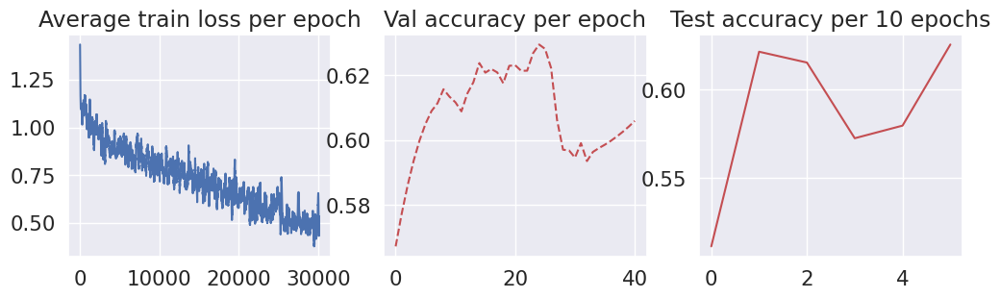

In [33]:
fig, axes = plt.subplots(1, 3, figsize=(12,3))
axes[0].plot(savgol_filter(loss_df2['loss_cls'].values, 301, 5), color="b")
axes[0].set_title("Average train loss per epoch")
axes[1].plot(savgol_filter(trainer.val_accuracy, 13, 2), color="r", linestyle="dashed")
axes[1].set_title("Val accuracy per epoch")
axes[2].plot(trainer.test_accuracy, color="r")
axes[2].set_title("Test accuracy per 10 epochs")

In [34]:
trained_epoch = trainer.current_epoch
n = len(trainer.train_losses)
trained_steps = n - (n % trained_epoch)
train_losses = reduce(np.array(
    trainer.train_losses[:trained_steps]), '(n k) -> n', 'mean', n=trained_epoch)

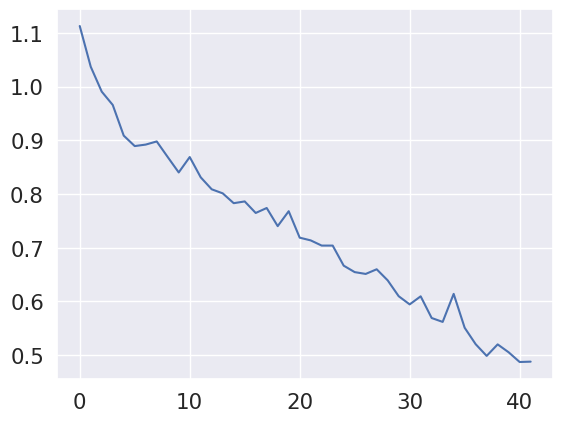

In [36]:
train_losses_cls = reduce(np.array(
    loss_df2['loss_cls'].values[:trained_steps]), '(n k) -> n', 'mean', n=trained_epoch)
plt.plot(train_losses_cls)

Text(0.5, 1.0, 'Test accuracy per 10 epochs')

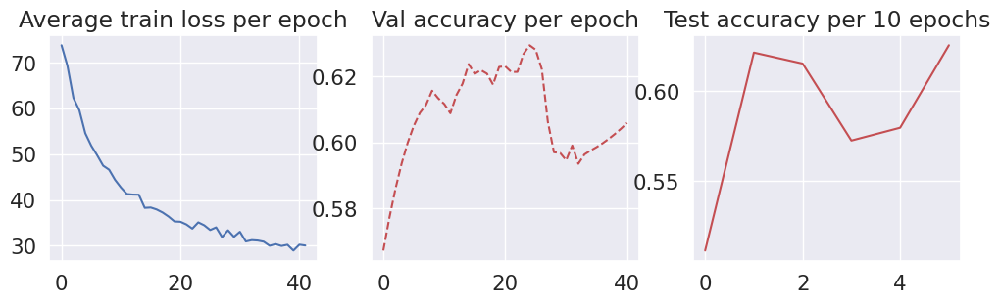

In [45]:
fig, axes = plt.subplots(1, 3, figsize=(12,3))
axes[0].plot(train_losses, color="b")
axes[0].set_title("Average train loss per epoch")
axes[1].plot(savgol_filter(trainer.val_accuracy, 13, 2), color="r", linestyle="dashed")
axes[1].set_title("Val accuracy per epoch")
axes[2].plot(trainer.test_accuracy, color="r")
axes[2].set_title("Test accuracy per 10 epochs")

Text(0.5, 1.0, 'Test accuracy per 10 epochs')

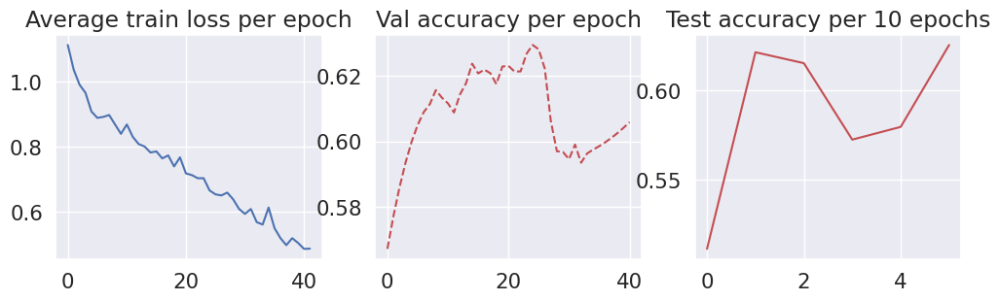

In [37]:
fig, axes = plt.subplots(1, 3, figsize=(12,3))
axes[0].plot(train_losses_cls, color="b")
axes[0].set_title("Average train loss per epoch")
axes[1].plot(savgol_filter(trainer.val_accuracy, 13, 2), color="r", linestyle="dashed")
axes[1].set_title("Val accuracy per epoch")
axes[2].plot(trainer.test_accuracy, color="r")
axes[2].set_title("Test accuracy per 10 epochs")

In [38]:
train_log = {
    'train_loss': torch.tensor(train_losses),
    'train_loss_cls': torch.tensor(train_losses_cls),
    'val_acc': torch.tensor(trainer.val_accuracy),
    'test_acc': torch.tensor(trainer.test_accuracy),
    'test_confusion_matrix': cm,
    'test_metrics': me,
    'test_metrics_detail': med
}
torch.save(train_log, log_dir+"train_metrics.pt")

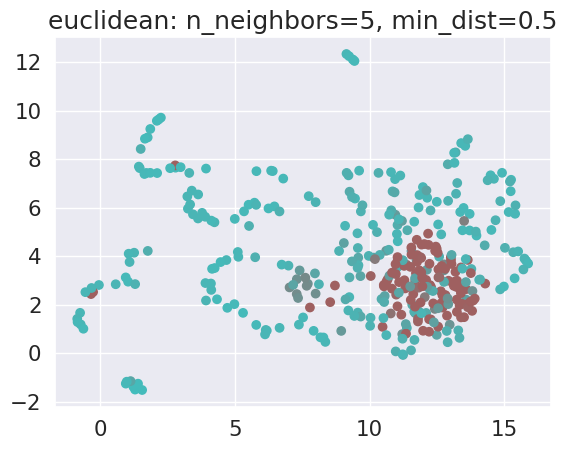

In [39]:
emb = model.embedding_filters.data.cpu()
emb_color, zcs = get_embedding_color_v2(emb)
k = 5
min_dist = 0.5
umap_metric = 'euclidean'
visualize_embedding_umap(emb, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric=umap_metric, 
          title=f'{umap_metric}: n_neighbors={k}, min_dist={min_dist}')

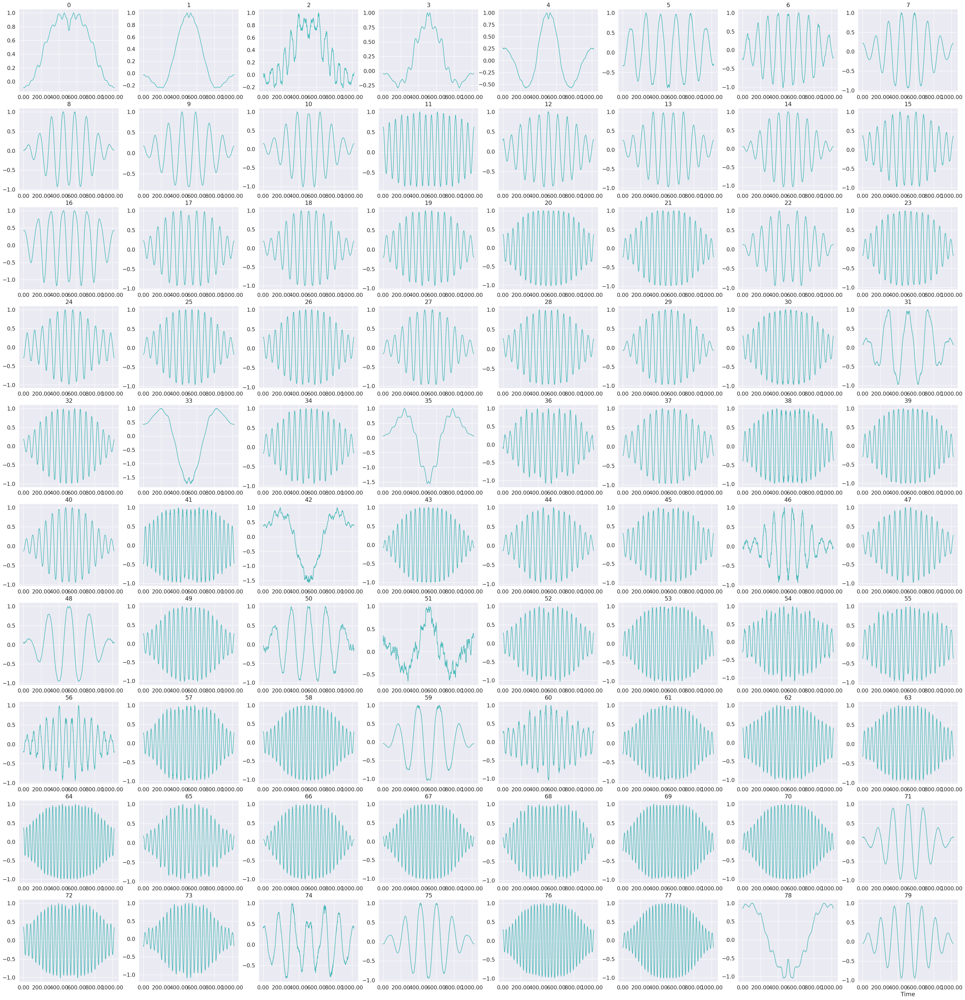

In [40]:
selected_emb_topk = torch.topk(zcs, 80)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

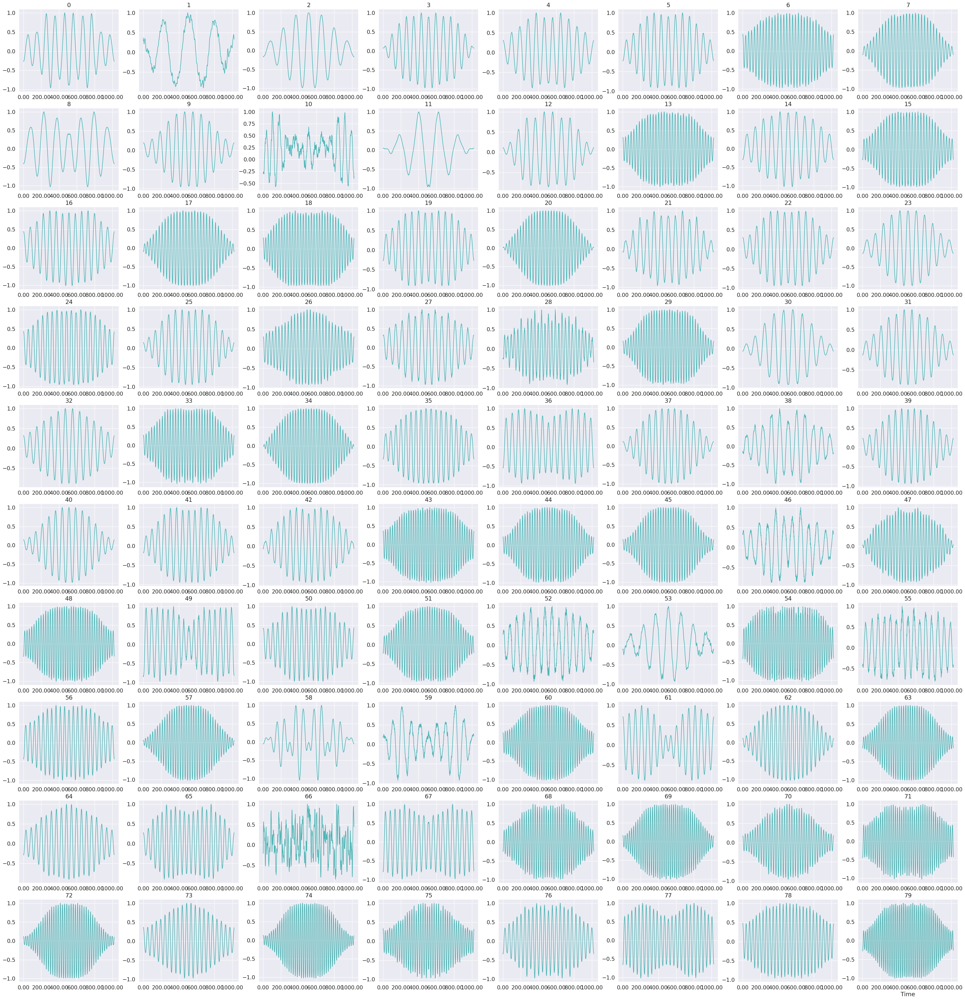

In [41]:
selected_emb_topk = torch.topk(zcs, 160)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

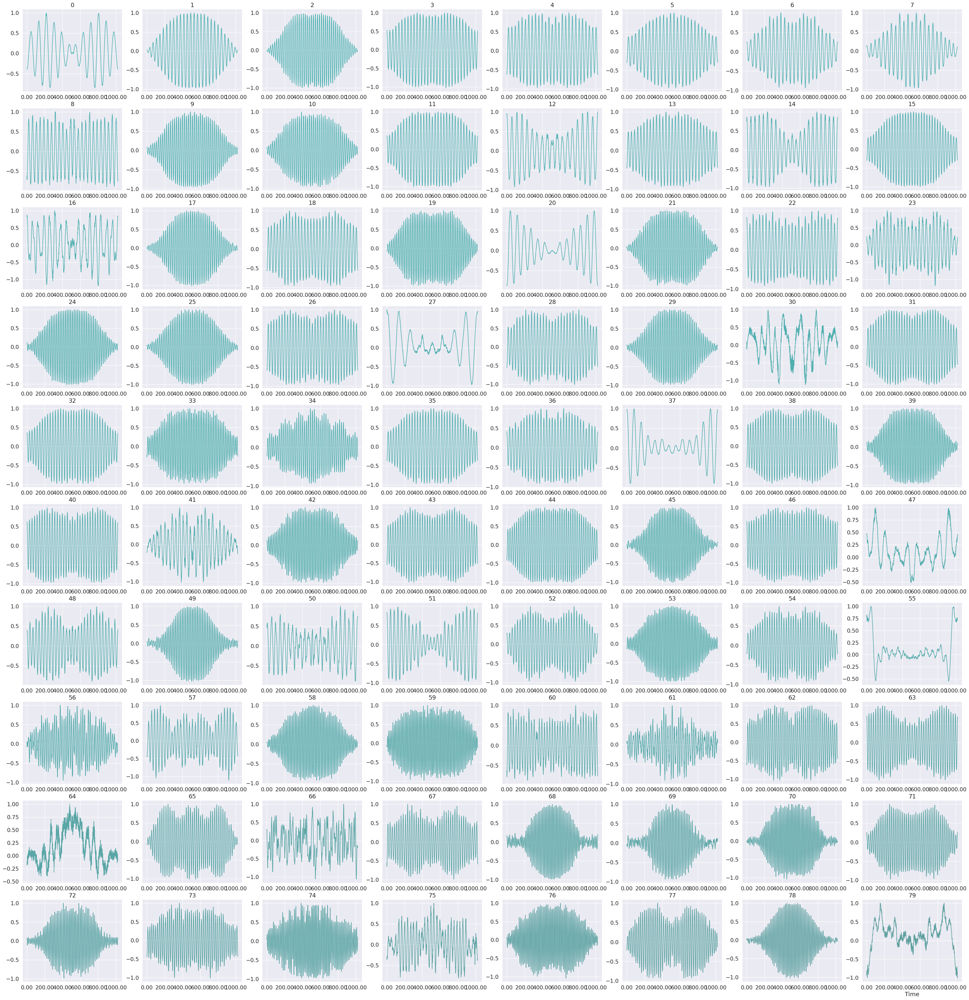

In [42]:
selected_emb_topk = torch.topk(zcs, 240)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

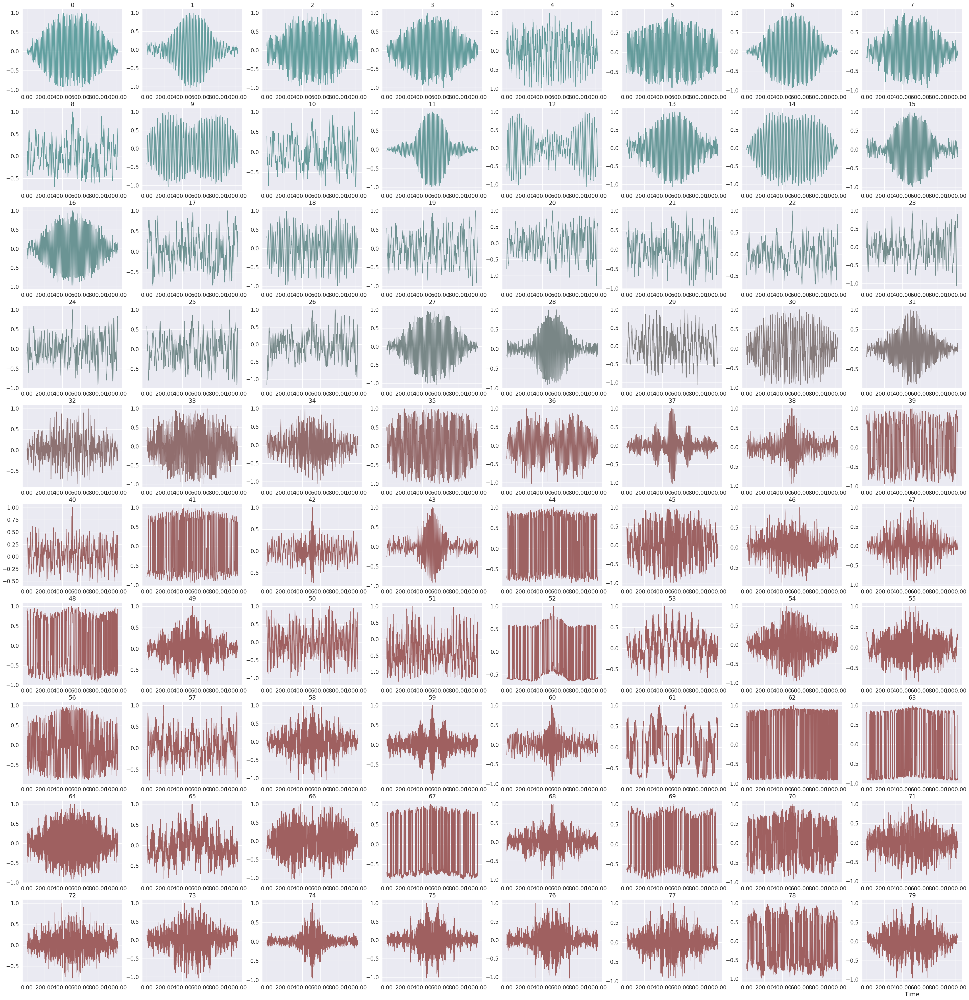

In [43]:
selected_emb_topk = torch.topk(zcs, 320)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

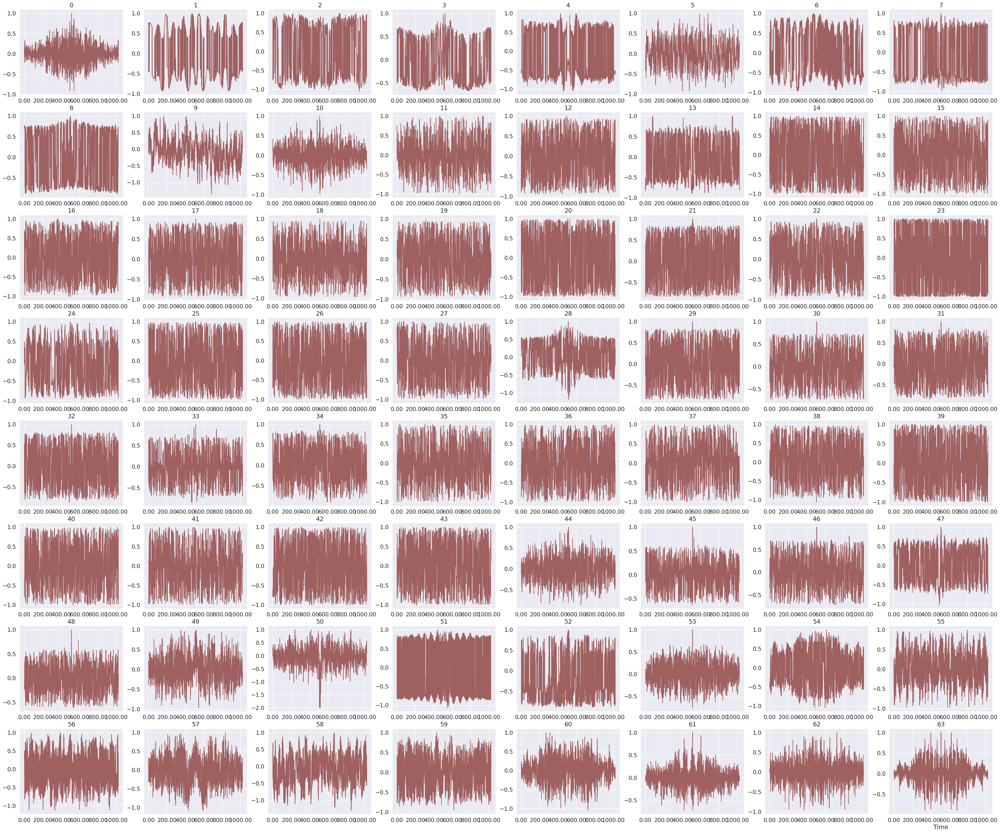

In [44]:
selected_emb_topk = torch.topk(zcs, 384)
selected_idx = selected_emb_topk.indices[-64:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=64, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)